In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import cv2
from sklearn.preprocessing import StandardScaler
import scipy.io as io
from random import uniform
from sklearn.metrics.pairwise import euclidean_distances

In [2]:
base = ''
img_path = base + 'images/test'
gt_path = base + 'ground_truth/test'
results_path = base + "/results"

# LOAD IMAGES AND GROUND TRUTHS TO DICT


In [3]:
dataset = {}
# Load images
dataset['imgs'] = np.empty((0, 321, 481, 3), int)
dataset['file_name'] = np.empty(100)
for dirname, _, filenames in os.walk(img_path):
    filenames.sort()
    for filename in filenames:
        dataset['file_name'] = filename
        temp = os.path.join(dirname, filename)
        img_tmp = cv2.imread(temp)
        if filename == 'Thumbs.db':
            continue
        img_rgb = cv2.cvtColor(img_tmp, cv2.COLOR_BGR2RGB)
        if img_rgb.shape[0] != 321:
            img_rgb = cv2.rotate(img_rgb, cv2.ROTATE_90_CLOCKWISE)
        img_rgb = np.array(img_rgb)
        dataset['imgs'] = np.append(dataset['imgs'], np.expand_dims(img_rgb, 0), axis=0)
        
   
            
# Load ground truths         
dataset['gt'] = []
for dirname, _, filenames in os.walk(gt_path):
    filenames.sort()
    for filename in filenames:
        temp = os.path.join(dirname, filename)
        file = io.loadmat(temp)
        map_list = []
    #   edges = file['groundTruth'][0][0][0][0][1]
        second_dim = file['groundTruth'].shape[1]        
        for i in range(second_dim):
            mapp = file['groundTruth'][0][i][0][0][0]
            map_list.append(mapp)
        #edges_255 = edges * 255
        #final = [edges_255, map_list]
        #dataset['gt'] = np.append(dataset['gt'], final)
        dataset['gt'].append(map_list)
       

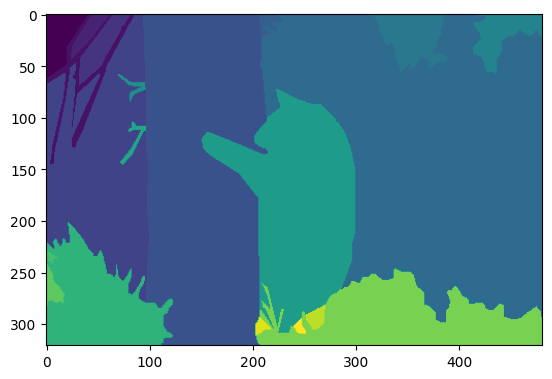

In [4]:
len(dataset['gt'][:][1][1])
plt.imshow(dataset['gt'][1][4])
plt.show()

In [5]:
def disp_image(image, title):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [6]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
def save_segmented_image(image, results_path, k, image_filename):
    # Create the results directory if it doesn't exist
    if not os.path.exists(results_path):
        os.makedirs(results_path)

    # Define the path to save the segmented image
    save_path = os.path.join(results_path, f"segmented_k{k}.jpg")

    # Save the image
    Image.fromarray(image).save(save_path)

# VISUALIZE RANDOM SAMPLE

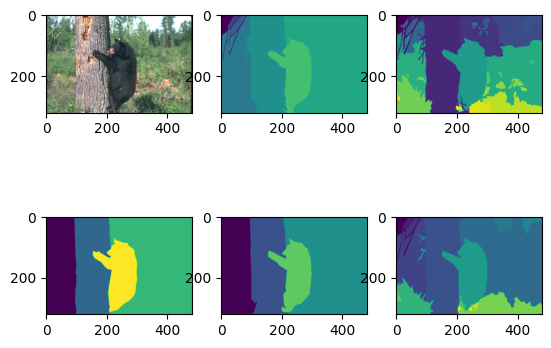

In [7]:
import random
def visualize_randomGT():
    n = random.randint(0, 200)
    n = 1
    fig, axes = plt.subplots(2, 3)
    image = dataset["imgs"][n]
    if dataset["gt"][n][0].shape[0] != 321:
        image = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
    axes[0, 0].imshow(image)
    axes[0, 1].imshow(dataset["gt"][n][0])
    axes[0, 2].imshow(dataset["gt"][n][1])
    axes[1, 0].imshow(dataset["gt"][n][2])
    axes[1, 1].imshow(dataset["gt"][n][3])
    axes[1, 2].imshow(dataset["gt"][n][4])
    plt.show()
visualize_randomGT()


# VISUALIZE IMAGE + K-SEGMENTATION + GROUND TRUTHS

In [8]:
def visualize_Images(n, assignment):
    fig, axes = plt.subplots(2, 3)
    image = dataset["imgs"][n]
    if dataset["gt"][n][0].shape[0] != 321:
        image = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
    if assignment.shape[0] == 321 and image.shape[0] != 321:
        assignment = cv2.rotate(assignment, cv2.ROTATE_90_COUNTERCLOCKWISE)
    axes[0, 0].imshow(image)
    axes[0, 1].imshow(assignment)
    axes[0, 2].imshow(dataset["gt"][n][0])
    axes[1, 0].imshow(dataset["gt"][n][1])
    axes[1, 1].imshow(dataset["gt"][n][2])
    axes[1, 2].imshow(dataset["gt"][n][3])
   # axes[1, 2].imshow(dataset["gt"][n][4])
    
    plt.show()

In [9]:
from sklearn.cluster import KMeans

image = dataset["imgs"][1]
image = image.reshape((321*481, -1))
kmeans2 = KMeans(n_clusters=3, random_state=0).fit(image)
indices2 = kmeans2.labels_
indices2 = np.reshape(indices2, (321, 481))

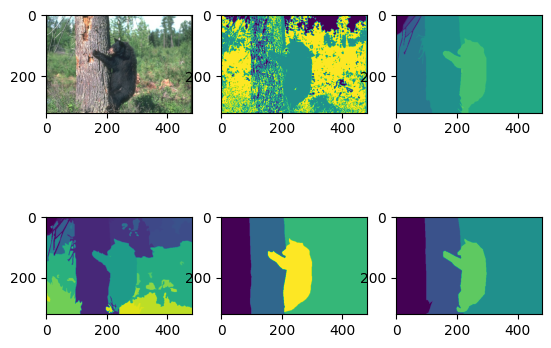

In [10]:
visualize_Images(1, indices2)

In [21]:
from sklearn.cluster import KMeans
results = {}
Ks = [3, 5, 7, 9, 11]
for k in Ks:
    results[k] = []
    for i in range(50):
        image = dataset['imgs'][i]
        image = image = image.reshape((321*481, -1))
        km = KMeans(n_clusters=k, max_iter=75)
        km.fit(image)
        indices = km.predict(image)
        results[k].append(indices)


# RUN CLUSTERIZATION AND SAVE RESULTS IN PICKLE DICTS


In [20]:
import pickle
import matplotlib.pyplot as plt  # Import matplotlib for visualization

# Create an empty dictionary to store visualizations
results_visualizations = {}
from sklearn.cluster import KMeans
results = {}
Ks = [3, 5, 7, 9, 11]
for k in Ks:
    results[k] = []
    visualizations = []  # Create an empty list to store visualizations for this k
    
    for i in range(50):
        image = dataset['imgs'][i]
        image = image.reshape((321*481, -1))
        km = KMeans(n_clusters=k, max_iter=75)
        km.fit(image)
        indices = km.predict(image)
        results[k].append(indices)
        
        # Convert indices back to the original shape
        clustered_image = indices.reshape((321, 481))
        
        # Create a visualization of the clustered image
        plt.figure(figsize=(8, 6))
        plt.imshow(clustered_image, cmap='viridis')
        plt.title(f'Clustered Image for k={k}, Image {i+1}')
        plt.colorbar()
        
        # Save the visualization or display it
        visualization_filename = f'clustered_image_k{k}_image{i+1}.png'
        plt.savefig(visualization_filename)
        visualizations.append(visualization_filename)
        plt.close()  # Close the current plot to avoid clutter
        
    # Store the visualizations for this k in the dictionary
    results_visualizations[k] = visualizations

# Save the results and visualizations using pickle
with open('results.pkl', 'wb') as f:
    pickle.dump(results, f)

with open('results_visualizations.pkl', 'wb') as f:
    pickle.dump(results_visualizations, f)


# LOAD PICKLE DICTS

In [11]:
# Load the results
import pickle
with open('results.pkl', 'rb') as f:
    results = pickle.load(f)

# Load the visualizations
with open('results_visualizations.pkl', 'rb') as f:
    results_visualizations = pickle.load(f)

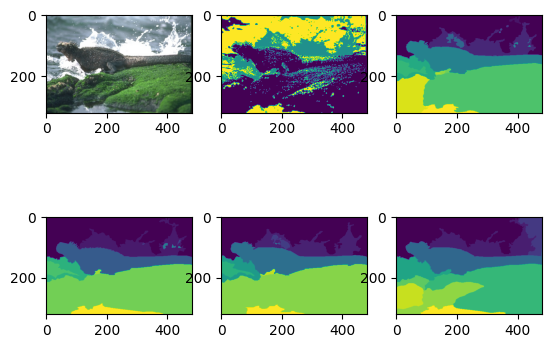

K= 3 n= 9


In [12]:
from sklearn.cluster import KMeans
Ks = [3, 5, 7, 9, 11]

k = random.choice(Ks)
n = random.randint(0, 50)
visualize_Images(n, np.reshape(results[k][n], (321, 481)))
print("K=", k, "n=", n)

# LOAD IMAGE VISUALIZATION



In [6]:
# Choose a specific value of k and image index
k = 11  # Change this to your desired value of k
image_index = 30  # Change this to your desired image index (0 to 49)

# Get the filename of the clustered image visualization
visualizations_dict = results_visualizations[k][image_index]

# Display the clustered image
from PIL import Image

clustered_image = Image.open(visualizations_dict)
clustered_image.show()


# SEGMENTATION EVALUATION

In [68]:
from sklearn.metrics.cluster import contingency_matrix
from scipy.interpolate import interp1d
def _contingency_matrices(labels_pred, labels_true):
    contingency_matrices = np.zeros((12, 50), dtype=object)
    
    for k in labels_pred.keys():
        for i, img_label in enumerate(labels_pred[k]):
            img = np.reshape(img_label, (321, 481, 1))
            gt_img = labels_true[i][1]
            #print(img_label.shape)
            tmp = np.zeros((len(gt_img),), dtype=object)
            for m, gt in enumerate(gt_img):
               # print(gt.shape)
                # Ensure that the gt and img_label have the same number of pixels
                gt_extended = np.repeat(gt, len(img_label) // len(gt) + 1)[:len(img_label)]
                # Define interpolation function to resize gt
                resize_factor = len(img_label) / len(gt_extended)
                f = interp1d(np.arange(len(gt_extended)), gt_extended, kind='linear')
                resized_gt = f(np.arange(len(img_label)) / resize_factor)

                tmp[m] = contingency_matrix(resized_gt, img_label)
                    
            contingency_matrices[k, i] = tmp
    return contingency_matrices

contingency_matrices = _contingency_matrices(results, dataset['gt'])

In [69]:
# Define a filename for saving the contingency matrices
contingency_matrices_filename = 'contingency_matrices.pkl'

# Save the contingency_matrices object to a file using pickle
with open(contingency_matrices_filename, 'wb') as f:
    pickle.dump(contingency_matrices, f)

In [13]:
contingency_matrices_filename = 'contingency_matrices.pkl'

# Load the contingency_matrices object from the file using pickle
with open(contingency_matrices_filename, 'rb') as f:
    loaded_contingency_matrices = pickle.load(f)

In [53]:
contingency_matrices.shape

(12, 50)

In [15]:
# def max_match_one_img(contingency, labels_pred, labels_true):
#     # we need both leabels_pred, labels_true
#     y_new = labels_pred.copy()
#     true_unique = np.unique(labels_true)
#     pred_unique = np.unique(labels_pred)
#     mapping = np.zeros(pred_unique.shape + (2,)) # +2 first column stores the predicted cluster IDs, and the second column stores the corresponding best-matching true cluster IDs.
#     for c in range(contingency.shape[-1]): # for every column
#         # get best match for each feature
#         best_match = np.argmax(contingency[:,c]) # for every k we curerntly have only eg..map k=7 to k =3 
#         y_new[labels_pred == pred_unique[c]] = true_unique[best_match]
#         mapping[c] = [pred_unique[c],true_unique[best_match]]
#     return y_new, mapping

In [17]:
def max_match_one_img(contingency, labels_pred, labels_true):
    # Initialize variables for best matches
    best_matches = np.argmax(contingency, axis=0)
    unique_pred = np.unique(labels_pred)
    unique_true = np.unique(labels_true)

    # Create a mapping dictionary for efficient lookup
    mapping_dict = dict(zip(unique_pred, unique_true[best_matches]))

    # Create a new_labels array by mapping predictions to true labels
    new_labels = np.vectorize(mapping_dict.get)(labels_pred)

    return new_labels


In [18]:
new_results = {}
# contingency_matrices
for k in results.keys():
    print("K =",k)
    new_results[k] = {}
    for i, img_label in enumerate(results[k]):
        new_results[k][i] = [] # for M GTs
        for m,gt_label in enumerate(dataset['gt'][i][1]):
            new_label = max_match_one_img(loaded_contingency_matrices[k][i][m],img_label,gt_label)
            new_results[k][i].append(new_label)

K = 3


KeyboardInterrupt: 

In [19]:
new_results = {}

# contingency_matrices
for k in results.keys():
    print("K =", k)
    new_results[k] = {}
        
    for i, img_label in enumerate(results[k]):
        new_results[k][i] = []  # for M GTs

        for m, gt_label in enumerate(dataset['gt'][i][1]):
            # Calculate new_label and mappings directly without creating unnecessary variables
            new_results[k][i].append(max_match_one_img(loaded_contingency_matrices[k][i][m], img_label, gt_label))


K = 3
K = 5
K = 7
K = 9
K = 11


In [21]:
# Define a filename for saving the new_results dictionary
new_results_filename = 'new_results.pkl'

# Save the new_results object to a file using pickle
with open(new_results_filename, 'wb') as f:
    pickle.dump(new_results, f)

print(f"new_results dictionary saved to {new_results_filename}")

KeyboardInterrupt: 

In [ ]:
new_results_filename = 'new_results.pkl'

# Load the new_results dictionary from the file using pickle
with open(new_results_filename, 'rb') as f:
    new_results = pickle.load(f)

# Calculate F-measure

In [29]:
# from sklearn.metrics import f1_score
# # for each K -> 50 images -> M Gts
# fmeasures = {}


# for k in new_results.keys():
#     print("K =",k)
#     fmeasures[k] = {}
#     for i, img_label in enumerate(new_results[k]):
#         fmeasures[k][i] = []
#         avg = 0
#         divide_by = len(new_results[k][i])
#         for m, m_label in enumerate(new_results[k][i]): # for each i there exists M GTs labels
#             gt_lbl = dataset['gt'][i][1][m]
#             gt_lbl = gt_lbl.reshape(-1)
#             f_scr = f1_score(gt_lbl,m_label, average='macro')
#             fmeasures[k][i].append(f_scr)
#             avg +=f_scr
#         fmeasures[k][i].append(avg/divide_by) # avg F-measure for GTs M, image I at K  is the last index

K = 3


ValueError: Found input variables with inconsistent numbers of samples: [481, 154401]

In [30]:
from sklearn.metrics import f1_score

# Initialize a dictionary to store F1 scores
fmeasures = {}

for k in new_results.keys():
    print("K =", k)
    fmeasures[k] = {}
    
    for i, img_label in enumerate(new_results[k]):
        fmeasures[k][i] = []
        avg = 0
        divide_by = len(new_results[k][i])
        
        for m, m_label in enumerate(new_results[k][i]):
            gt_lbl = dataset['gt'][i][1][m]
            
            # Ensure that both arrays have the same number of elements
            if gt_lbl.size != m_label.size:
                m_label = np.repeat(m_label, gt_lbl.size // m_label.size + 1)[:gt_lbl.size]
            
            f_scr = f1_score(gt_lbl, m_label, average='macro')
            fmeasures[k][i].append(f_scr)
            avg += f_scr
        
        fmeasures[k][i].append(avg / divide_by)  # Average F-measure for GTs M, image I at K is the last index


K = 3
K = 5
K = 7
K = 9
K = 11


In [31]:
avg_fmeasure = {}

for k in fmeasures.keys():
    avg_fmeasure[k] = {}
    for i in fmeasures[k]:
        avg_fmeasure[k][i] = fmeasures[k][i][-1]

avg_fmeasure

{3: {0: 0.8028039142590946,
  1: 0.08600638005428818,
  2: 0.2919635353353219,
  3: 0.5725105980160204,
  4: 0.27316590292265647,
  5: 0.2397296321914658,
  6: 0.5563990048873065,
  7: 0.43814239623532103,
  8: 0.49930484331899766,
  9: 0.5010117497781361,
  10: 0.44079858913266584,
  11: 0.5371971004136064,
  12: 0.3176401158446346,
  13: 0.6097782660567722,
  14: 0.663783096636885,
  15: 0.30343612354146926,
  16: 0.5296974689598539,
  17: 0.44975372597202534,
  18: 0.675866339189387,
  19: 0.2217185022193072,
  20: 0.5546107071016007,
  21: 0.336175067120602,
  22: 0.6675043420085095,
  23: 0.2818723990199194,
  24: 0.47913382113634984,
  25: 0.19745075404840118,
  26: 0.28149391304293014,
  27: 0.20171820575510402,
  28: 0.2611662955978339,
  29: 0.24570025190320635,
  30: 0.13315537561802349,
  31: 0.14606136365733186,
  32: 0.5908054982355401,
  33: 0.18694035976794962,
  34: 0.2113283160755987,
  35: 0.1611908048940715,
  36: 0.4309468273195417,
  37: 0.34829095018768513,
  38: 

In [32]:
def _conditional_entropy(cluster_labels, gt_labels):
    n = cluster_labels.shape[0]
    
    cond_ent = 0
    
    for c in np.unique(cluster_labels):
        # for each cluster c in clustering
        nc = (cluster_labels == c).shape[0]
        ent = 0
        for k in np.unique(gt_labels):
            # for each label in the cluster
            nkc = (gt_labels[cluster_labels == c] == k).shape[0]
            p = nkc / nc
            ent += (-1 * p * np.log(p))
        cond_ent += (ent * nc / n)
    return cond_ent

In [ ]:
            # gt_extended = np.repeat(gt, len(img_label) // len(gt) + 1)[:len(img_label)]
            # # Define interpolation function to resize gt
            # resize_factor = len(img_label) / len(gt_extended)
            # f = interp1d(np.arange(len(gt_extended)), gt_extended, kind='linear')
            # resized_gt = f(np.arange(len(img_label)) / resize_factor)

In [36]:
entropies1 = {}

for k in new_results.keys():
    print("K =", k)
    entropies1[k] = {}
    for i, img_label in enumerate(new_results[k]):
        entropies1[k][i] = []
        avg = 0
        divide_by = len(new_results[k][i])
        for m, m_label in enumerate(new_results[k][i]):
            gt_lbl = dataset['gt'][i][1][m]
            
            # Ensure that both arrays have the same total number of elements
            total_elements = 321 * 481
            if gt_lbl.size != total_elements:
                gt_lbl = np.repeat(gt_lbl, total_elements // gt_lbl.size + 1)[:total_elements]
            
            if m_label.size != total_elements:
                m_label = np.repeat(m_label, total_elements // m_label.size + 1)[:total_elements]
            
            gt_lbl = np.reshape(gt_lbl, (total_elements, -1))
            
            entropy = _conditional_entropy(m_label, gt_lbl)
            entropies1[k][i].append(entropy)
            avg += entropy
        
        entropies1[k][i].append(avg / divide_by)  # Average cond. entropy for GTs M, image I at K is the last index

entropies1


K = 3
K = 5


MemoryError: Unable to allocate 1.18 MiB for an array with shape (154401,) and data type int64

In [38]:
def _conditional_entropy(cluster_labels, gt_labels):
    nc = cluster_labels.shape[0]
    ent = 0

    unique_cluster_labels = np.unique(cluster_labels)
    unique_gt_labels = np.unique(gt_labels)

    for c in unique_cluster_labels:
        for k in unique_gt_labels:
            nkc = np.sum((cluster_labels == c) & (gt_labels == k))
            if nkc > 0:
                p = nkc / nc
                ent += (-1 * p * np.log(p))
    
    return ent

entropies1 = {}

for k in new_results.keys():
    print("K =", k)
    entropies1[k] = {}
    for i, img_label in enumerate(new_results[k]):
        entropies1[k][i] = []
        avg = 0
        divide_by = len(new_results[k][i])
        for m, m_label in enumerate(new_results[k][i]):
            gt_lbl = dataset['gt'][i][1][m]

            total_elements = 321 * 481
            if gt_lbl.size != total_elements:
                gt_lbl = np.repeat(gt_lbl, total_elements // gt_lbl.size + 1)[:total_elements]

            if m_label.size != total_elements:
                m_label = np.repeat(m_label, total_elements // m_label.size + 1)[:total_elements]

            gt_lbl = np.reshape(gt_lbl, (total_elements,))
            m_label = np.reshape(m_label, (total_elements,))

            entropy = _conditional_entropy(m_label, gt_lbl)
            entropies1[k][i].append(entropy)
            avg += entropy

        entropies1[k][i].append(avg / divide_by)  # Average cond. entropy for GTs M, image I at K is the last index

entropies1


K = 3
K = 5
K = 7
K = 9
K = 11


{3: {0: [0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.09321004411786912,
   0.2870417114655689,
   0.31605164292092525,
   0.3646720642187304,
   0.41567834576395357,
   0.9077566950826407,
   1.1550514084932388,
   1.1874930408311624,
   1.2098502373194324,
   0.6663575276919589,
   0.6579366914346285,
   0.6508368186681441,
   0.6416891157262079,
   0.5992308094456065,
   0.5398295804453163,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0

In [39]:
avg_entropy = {}

for k in entropies1.keys():
    avg_entropy[k] = {}
    for i in entropies1[k]:
#         print(entropies[k][i][-1])
        avg_entropy[k][i] = entropies1[k][i][-1]

avg_entropy

{3: {0: 0.22141197050369207,
  1: 2.2007203891526257,
  2: 1.4390318082818525,
  3: 0.4386263773572841,
  4: 1.3955601285887227,
  5: 1.1933432702566875,
  6: 0.7832026417482133,
  7: 0.8472534287040794,
  8: 0.6209836775074418,
  9: 0.6468021007840992,
  10: 0.6818108167736551,
  11: 0.6530977203700009,
  12: 0.6385226912395027,
  13: 0.3663154507242157,
  14: 0.2812773036365236,
  15: 1.2658326247776652,
  16: 0.4805092995339135,
  17: 0.9703225081779375,
  18: 0.429535158868426,
  19: 1.0557556201046687,
  20: 0.4353639658203524,
  21: 1.2994491087508622,
  22: 0.528860530818795,
  23: 1.2825375373273975,
  24: 0.852560294358602,
  25: 1.340627942504734,
  26: 1.3347045432617424,
  27: 1.1694450306990474,
  28: 1.2611051357034473,
  29: 1.7135574402404292,
  30: 1.7904897348329873,
  31: 2.00167102800638,
  32: 0.40044791945675623,
  33: 1.5975764524234217,
  34: 1.1875418250883352,
  35: 1.5358132743836843,
  36: 0.9303423235699603,
  37: 0.8023957803733627,
  38: 1.302586519448728

In [40]:
avg_fmeasure_sorted = {key: val for key, val in sorted(avg_fmeasure[3].items(), key = lambda ele: ele[1])}
avg_entropy_sorted = {key: val for key, val in sorted(avg_entropy[3].items(), key = lambda ele: ele[1])}
best_5_entropy = list(avg_entropy_sorted.keys())[:5] # first 5
worst_5_entropy = list(avg_entropy_sorted.keys())[-5:] # last 5

# Fmeasure 
best_5_fmeasure = list(avg_fmeasure_sorted.keys())[-5:] # last 5
worst_5_fmeasure = list(avg_fmeasure_sorted.keys())[:5] # first 5

In [45]:
def show_segments(img_idx):
    fig, axes = plt.subplots(2, 3)
    image = dataset["imgs"][img_idx]
    # if dataset["gt"][n][0].shape[0] != 321:
    #     image = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
    # if assignment.shape[0] == 321 and image.shape[0] != 321:
    #     assignment = cv2.rotate(assignment, cv2.ROTATE_90_COUNTERCLOCKWISE)
    axes[0, 0].imshow(image)
    axes[0, 1].imshow(np.reshape(results[3][img_idx], (321, 481)))
    axes[0, 2].imshow(np.reshape(results[5][img_idx], (321, 481)))
    axes[1, 0].imshow(np.reshape(results[7][img_idx], (321, 481)))
    axes[1, 1].imshow(np.reshape(results[9][img_idx], (321, 481)))
    axes[1, 2].imshow(np.reshape(results[11][img_idx], (321, 481)))
    plt.show()

# Best 5 Entropies of images shown

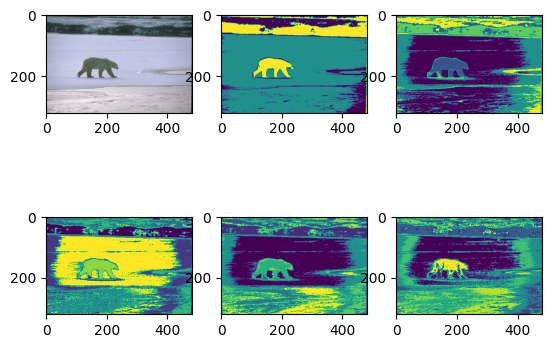

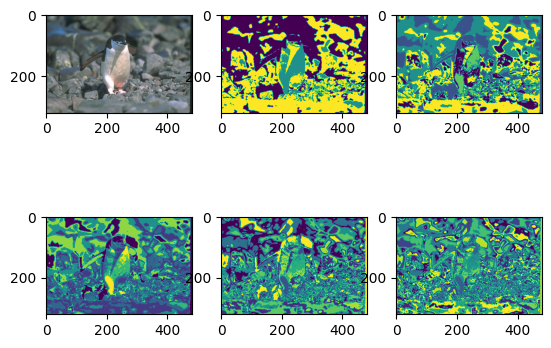

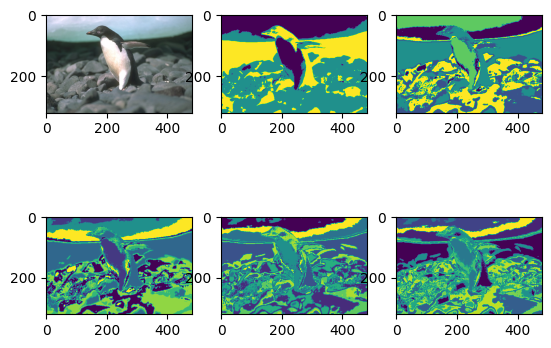

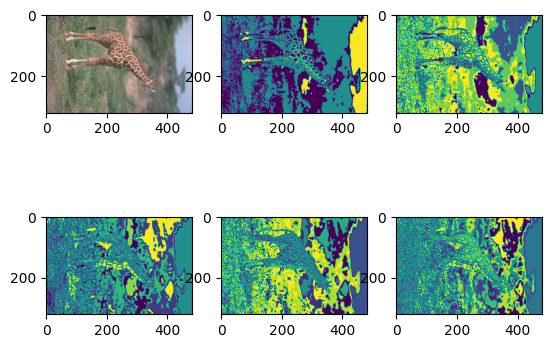

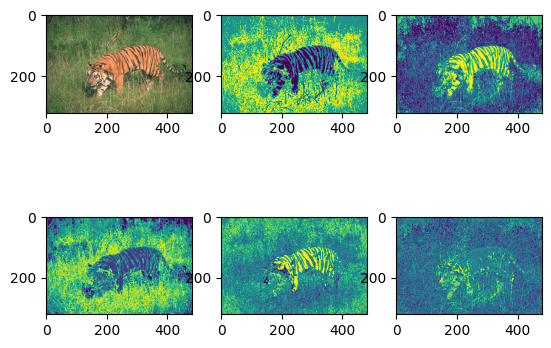

In [46]:
for i in best_5_entropy:
    show_segments(i)

# Best 5 F-Measures of Images Shown

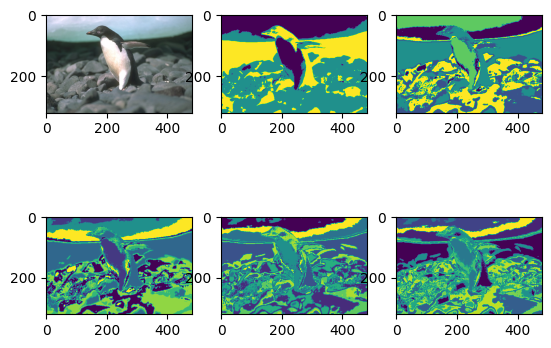

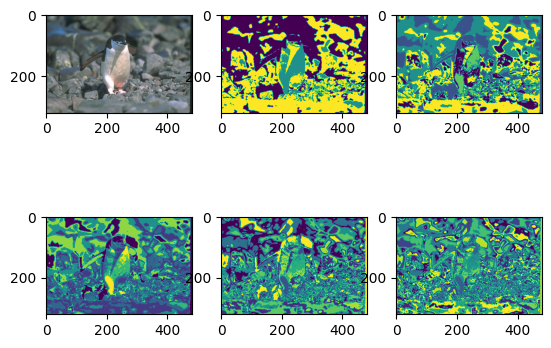

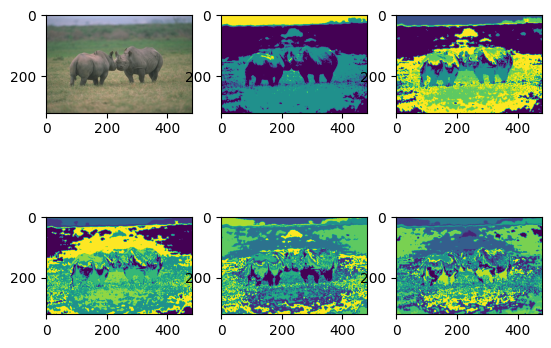

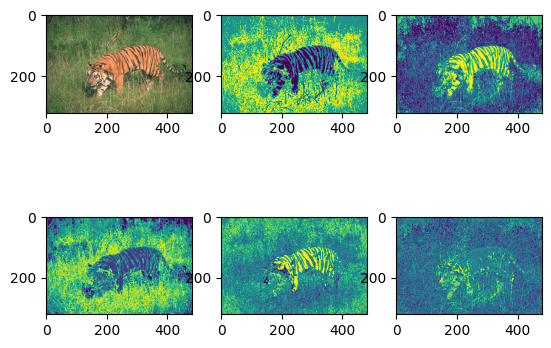

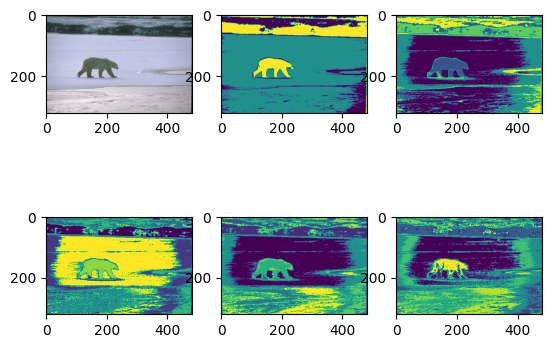

In [47]:
for i in best_5_fmeasure:
    show_segments(i)

# Worst 5 Entropies

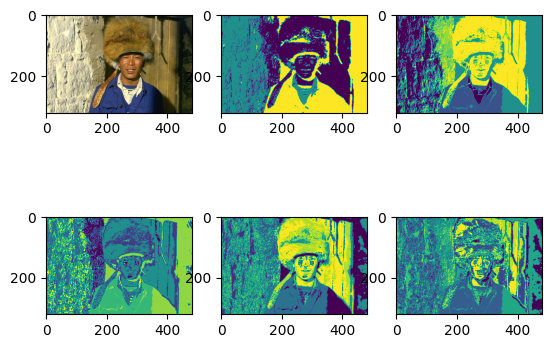

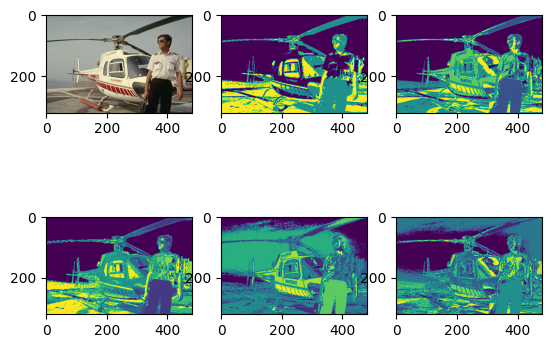

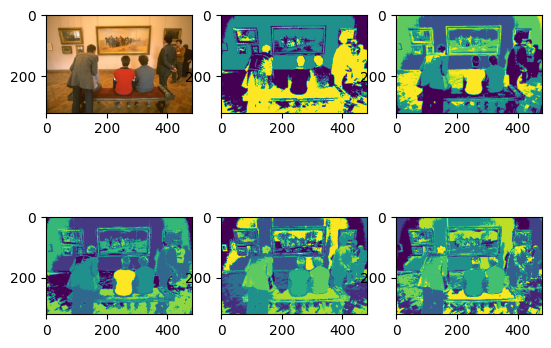

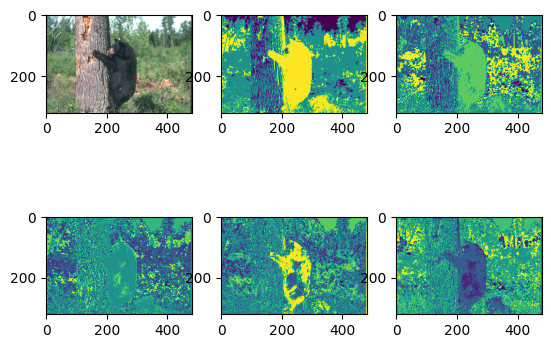

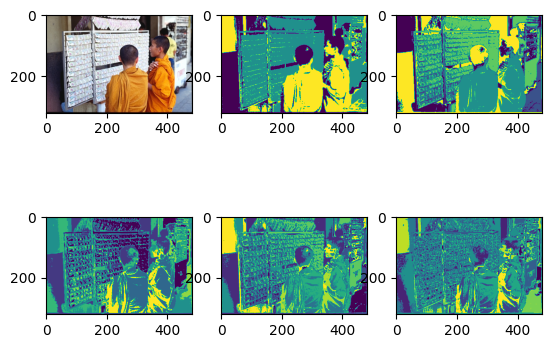

In [48]:
for i in worst_5_entropy:
    show_segments(i)

# Worst 5 F-Measure

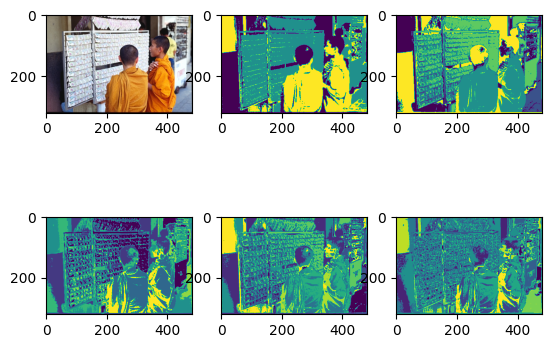

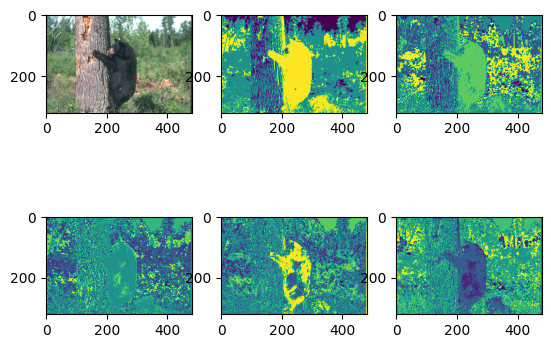

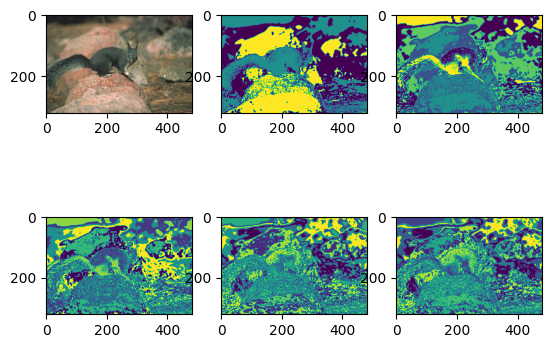

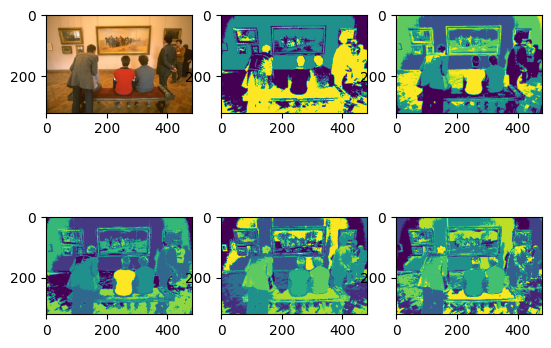

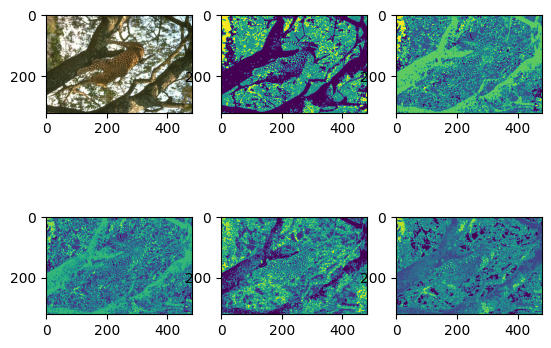

In [49]:
for i in worst_5_fmeasure:
    show_segments(i)

# BIG PICTURE

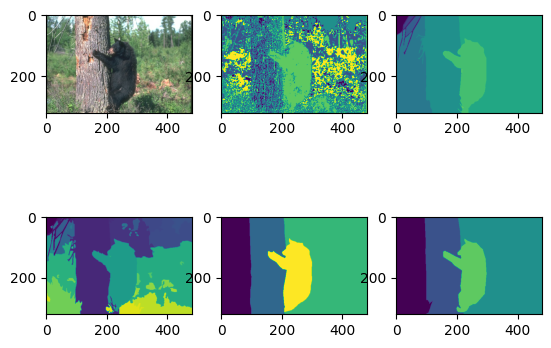

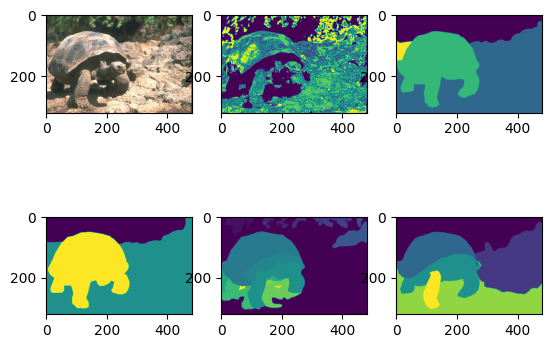

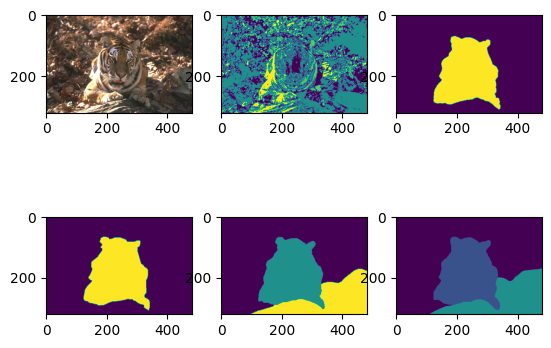

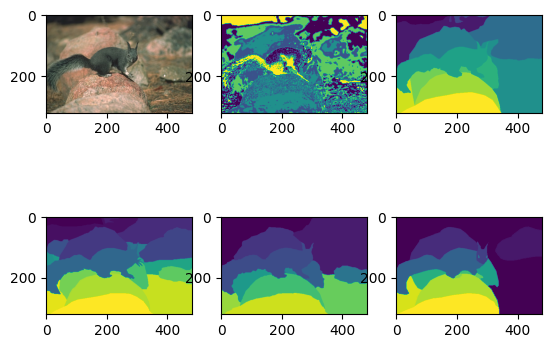

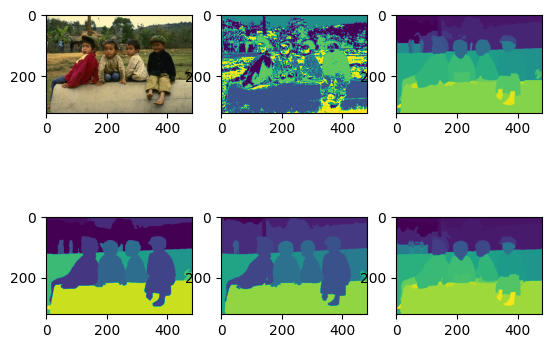

In [50]:
selected_images = [1,7,20,30,47]
seg_res_k_means = []
for img_idx in selected_images:
    segmented_image = np.reshape(results[5][img_idx], (321, 481))
    visualize_Images(img_idx, segmented_image)
    seg_res_k_means.append(segmented_image)


c:\Users\Mostafa\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


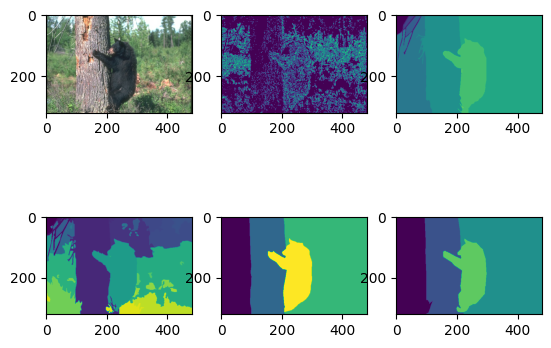

c:\Users\Mostafa\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


In [54]:
from sklearn.cluster import SpectralClustering

selected_images = [1,7,20,30,47]

seg_res_spectral = []

for img_idx in selected_images:
    image = dataset["imgs"][img_idx]
    X = np.reshape(image, (321*481, -1))
    spectral = SpectralClustering(n_clusters=5, eigen_solver='amg', n_init=30, random_state=5, affinity='nearest_neighbors', n_neighbors=5, n_jobs=-1)
    segmented_image = spectral.fit_predict(X)
    segmented_image = np.reshape(segmented_image, (321, 481))
    seg_res_spectral.append(segmented_image)
    visualize_Images(img_idx, segmented_image)

In [34]:
%pip install pyamg

   ---------------------------------------- 0.0/1.6 MB ? eta -:--:--
    --------------------------------------- 0.0/1.6 MB 1.4 MB/s eta 0:00:02
   - -------------------------------------- 0.1/1.6 MB 787.7 kB/s eta 0:00:02
   -- ------------------------------------- 0.1/1.6 MB 939.4 kB/s eta 0:00:02
   --- ------------------------------------ 0.2/1.6 MB 766.6 kB/s eta 0:00:02
   ---- ----------------------------------- 0.2/1.6 MB 845.5 kB/s eta 0:00:02
   ----- ---------------------------------- 0.2/1.6 MB 765.3 kB/s eta 0:00:02
   -------- ------------------------------- 0.3/1.6 MB 955.3 kB/s eta 0:00:02
   --------- ------------------------------ 0.4/1.6 MB 1.0 MB/s eta 0:00:02
   ---------- ----------------------------- 0.4/1.6 MB 913.9 kB/s eta 0:00:02
   ------------ --------------------------- 0.5/1.6 MB 906.4 kB/s eta 0:00:02
   ------------- -------------------------- 0.5/1.6 MB 868.1 kB/s eta 0:00:02
   --------------- ------------------------ 0.6/1.6 MB 992.1 kB/s eta 0:00:01

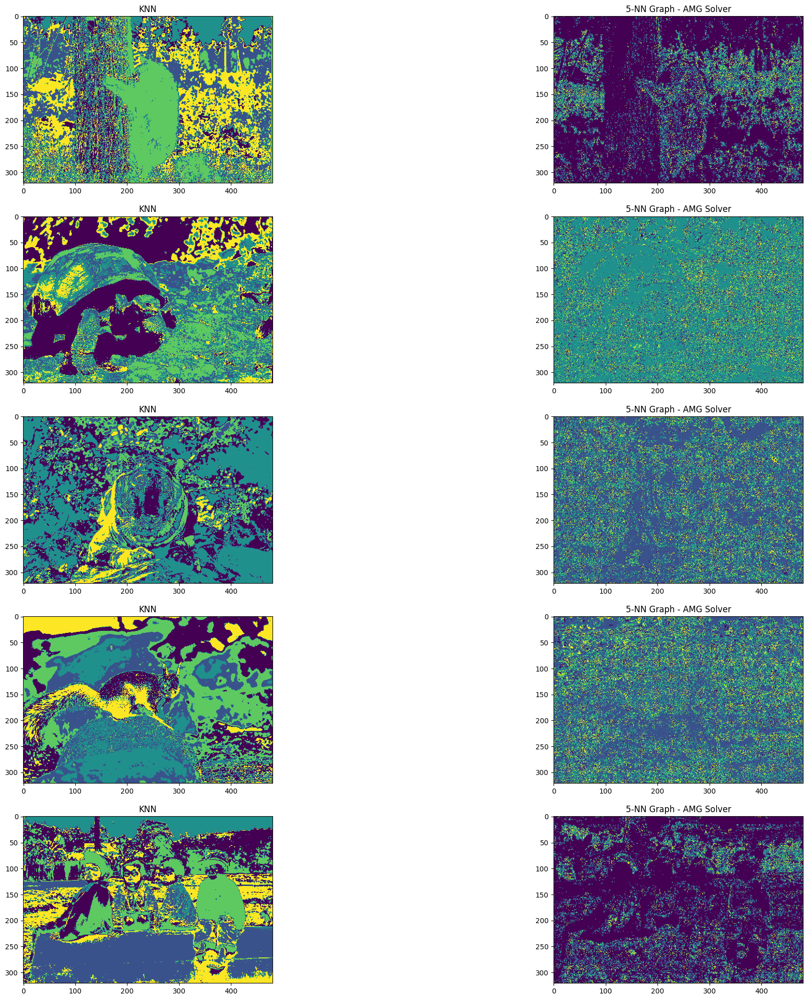

In [37]:
fig, axes = plt.subplots(5, 2)
plt.rcParams['figure.figsize'] = 25, 25
for i in range(5):
        axes[i][0].imshow(seg_res_k_means[i])
        axes[i][0].set_title("5-NN Graph - AMG Solver")
        axes[i][1].imshow(seg_res_spectral[i])
        axes[i][1].set_title("KNN")

        
plt.show()

# EXTRA: SPATIAL LAYOUT

In [43]:
def perform_kmeans_with_spatial_layout(image, n_clusters=5, max_iter=75):
    # Extract the color features (RGB) from the image
    color_features = image.reshape((-1, 3))  # Flatten the image into a 2D array of RGB values

    # Create an array of spatial coordinates (X and Y)
    height, width, _ = image.shape
    x_coordinates = np.tile(np.arange(width), height)  # Create X-coordinate array
    y_coordinates = np.repeat(np.arange(height), width)  # Create Y-coordinate array

    # Combine color features and spatial coordinates to create the modified feature vector
    modified_feature_vector = np.column_stack((color_features, x_coordinates, y_coordinates))

    # Perform K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, max_iter=max_iter)
    clusters = kmeans.fit_predict(modified_feature_vector)

    # Reshape the clustering results to the original image shape for visualization
    clustered_image = clusters.reshape((height, width))

    return clustered_image


In [44]:
spatial_seg_res = []
for img_idx in selected_images:
    image = dataset["imgs"][img_idx]
    clustered_image = perform_kmeans_with_spatial_layout(image, n_clusters=5, max_iter=75)
    spatial_seg_res.append(clustered_image)

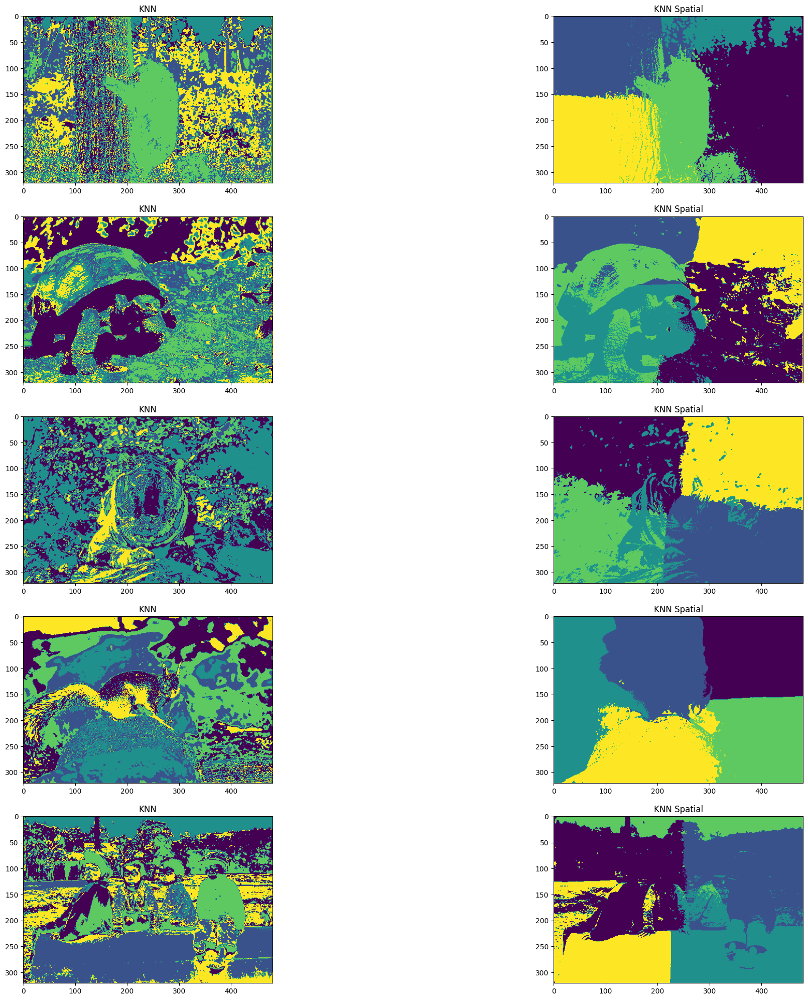

In [45]:
fig, axes = plt.subplots(5, 2)
plt.rcParams['figure.figsize'] = 15, 15
for i in range(5):
        axes[i][0].imshow(seg_res_k_means[i])
        axes[i][0].set_title("K means clustering")
        axes[i][1].imshow(spatial_seg_res[i])
        axes[i][1].set_title("K means Spatial")
        
plt.show()